# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

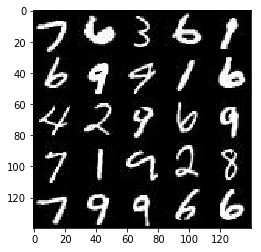

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
import pickle as pkl
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

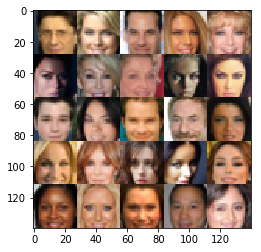

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1


/home/johnny/anaconda2/envs/face_generation/lib/python3.5/site-packages/ipykernel/__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_images = tf.placeholder(dtype=tf.float32, 
                                 shape=(None, image_width, image_height, image_channels),
                                 name='real_images')
    
    z_input = tf.placeholder(dtype=tf.float32,
                             shape=(None, z_dim),
                             name='z_input')
    
    learning_rate = tf.placeholder(dtype=tf.float32, name='learning_rate')
    
    drop_prob = tf.placeholder(dtype=tf.float32, name='drop_prob')

    return real_images, z_input, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha=0.1):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    drop_rate=0.1
    
    with tf.variable_scope('discriminator', reuse=reuse):
        # Starts 28x28x3
        x1 = tf.layers.conv2d(images, filters=64,
                              kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d(),
                              kernel_size=(5,5),
                              strides=(2,2),
                              padding='SAME',
                             )
        # Now 14x14x64
        a1 = tf.maximum(x1, alpha*x1)
        d1 = tf.layers.dropout(a1,rate=drop_rate)
        
        x2 = tf.layers.conv2d(d1, filters=128,
                              kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d(),
                              kernel_size=(5,5),
                              strides=(2,2),
                              padding='SAME')
        # Now 7x7x128
        bn1 = tf.layers.batch_normalization(x2, training=True)
        a2 = tf.maximum(bn1, alpha*bn1)
        d2 = tf.layers.dropout(a2, rate=drop_rate)
        
        x3 = tf.layers.conv2d(d2, filters=256,
                              kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d(),
                              kernel_size=(5,5),
                              strides=(2,2),
                              padding='SAME')
        # Now 4x4x256
        bn2 = tf.layers.batch_normalization(x3, training=True)
        a3 = tf.maximum(bn2, alpha*bn2)
        
        d3 = tf.layers.dropout(a3, rate=drop_rate)
        
        x4 = tf.reshape(d3, shape=(-1, 4*4*256))
        # Now size = [batch_size, 4096 = 4*4*256]
        
        logits = tf.layers.dense(inputs=x4, units=1)
        
        output = tf.nn.sigmoid(logits)

    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [17]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha =0.1
    with tf.variable_scope('generator', reuse= not is_train):
        fc1 = tf.layers.dense(z, units=3*3*512)
        x1 = tf.reshape(fc1, shape=(-1,3,3,512))
        # Shape is 4x4x512
        cn1 = tf.layers.conv2d_transpose(x1,
                                         kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d(),
                                         filters=256,
                                         kernel_size=(5,5),
                                         strides=(1,1),
                                         padding='VALID')
        #print(cn1.shape)
        # Shape should be 7x7x256
        #print(cn1.shape)
        bn1 = tf.layers.batch_normalization(cn1, training=is_train)
        a1 = tf.maximum(bn1, alpha*bn1)
        
        cn2 = tf.layers.conv2d_transpose(a1,
                                         kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d(),
                                         filters=128,
                                         kernel_size=(5,5),
                                         strides=(2,2),
                                         padding='SAME')
        #print(cn2.shape)
        #shape 14x14x128
        #print(cn2.shape)
        bn2 = tf.layers.batch_normalization(cn2, training=is_train)
        a2 = tf.maximum(bn2, bn2*alpha)
        
        cn3 = tf.layers.conv2d_transpose(a2,
                                         kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d(),
                                         filters=out_channel_dim,
                                         kernel_size=(5,5),
                                         strides=(2,2),
                                         padding='SAME')
        #shape 28x28xout_channel_dim
        #print(cn3.shape)
        output = tf.tanh(cn3)
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [18]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    d_real_outputs, d_real_logits = discriminator(input_real, reuse=False)
    g_outputs = generator(input_z, out_channel_dim, is_train=True)
    d_fake_outputs, d_fake_logits = discriminator(g_outputs, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
        logits=d_real_logits,
        labels=tf.ones_like(d_real_logits)*0.9))
    
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
        logits=d_fake_logits,
        labels=tf.zeros_like(d_fake_logits)))
    
    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
        logits=d_fake_logits,
        labels=tf.ones_like(d_fake_logits)))
    
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [19]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_optimizer = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_optimizer = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss,var_list=g_vars)
    
    return d_optimizer, g_optimizer


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [20]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()
    return images_grid

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [24]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    
    real_images, z_inputs, lr = model_inputs(data_shape[1],data_shape[2],data_shape[3],z_dim)
    #the numbers for model inputs are determined by the data
    if data_image_mode is "RGB":
        out_channel_dim = 3
    else:
        out_channel_dim = 1
        
    d_loss, g_loss = model_loss(real_images, z_inputs, out_channel_dim)
    
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)

    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_dim))

    samples, losses = [], []
    steps = 0    

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                z_data = np.random.uniform(low=-1,
                                           high=1,
                                           size=(batch_size, z_dim))
                
                _ =sess.run(d_opt,feed_dict={real_images: batch_images,
                                             z_inputs: z_data,
                                             lr: learning_rate})
                _ =sess.run(g_opt,feed_dict={real_images: batch_images,
                                             z_inputs: z_data,
                                             lr: learning_rate})
                if steps%25==0:
                    train_loss_d = d_loss.eval({z_inputs: z_data, real_images: 2*batch_images})
                    train_loss_g = g_loss.eval({z_inputs: z_data})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))
                
                if steps%100==0:
                    samples.append(show_generator_output(sess, 25, z_inputs, out_channel_dim, data_image_mode))
                    saver.save(sess, './checkpoints/generator.ckpt',global_step=steps)
                    
    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples            

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

In [25]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

Epoch 1/2... Discriminator Loss: 2.3437... Generator Loss: 0.2868


KeyboardInterrupt: 

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/5... Discriminator Loss: 0.9711... Generator Loss: 0.9851
Epoch 1/5... Discriminator Loss: 0.6806... Generator Loss: 2.8592
Epoch 1/5... Discriminator Loss: 0.8596... Generator Loss: 1.3791
Epoch 1/5... Discriminator Loss: 0.8308... Generator Loss: 1.2941


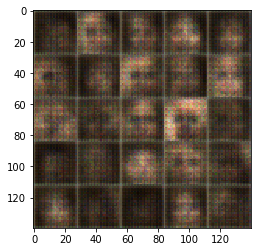

Epoch 1/5... Discriminator Loss: 0.8554... Generator Loss: 1.8409
Epoch 1/5... Discriminator Loss: 0.8357... Generator Loss: 1.4395
Epoch 1/5... Discriminator Loss: 1.7088... Generator Loss: 0.3942
Epoch 1/5... Discriminator Loss: 1.4323... Generator Loss: 0.5211


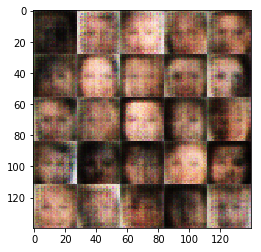

Epoch 1/5... Discriminator Loss: 1.1374... Generator Loss: 0.8316
Epoch 1/5... Discriminator Loss: 1.7227... Generator Loss: 0.3240
Epoch 1/5... Discriminator Loss: 1.5887... Generator Loss: 0.4034
Epoch 1/5... Discriminator Loss: 1.3931... Generator Loss: 0.5935


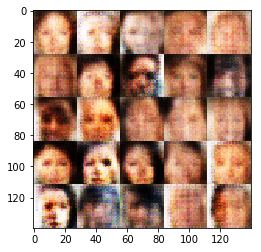

Epoch 1/5... Discriminator Loss: 1.1885... Generator Loss: 1.1839
Epoch 1/5... Discriminator Loss: 1.0283... Generator Loss: 1.1355
Epoch 1/5... Discriminator Loss: 1.1805... Generator Loss: 0.8334
Epoch 1/5... Discriminator Loss: 1.7130... Generator Loss: 0.3898


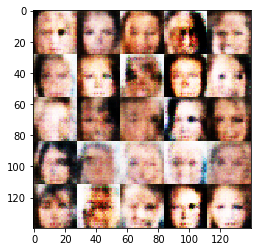

Epoch 1/5... Discriminator Loss: 1.1452... Generator Loss: 0.7994
Epoch 1/5... Discriminator Loss: 1.2735... Generator Loss: 1.2417
Epoch 1/5... Discriminator Loss: 1.3565... Generator Loss: 1.2434
Epoch 1/5... Discriminator Loss: 1.1751... Generator Loss: 0.7144


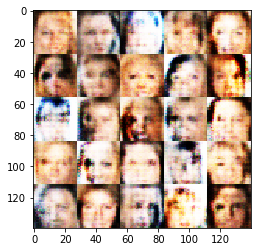

Epoch 1/5... Discriminator Loss: 1.1686... Generator Loss: 0.9342
Epoch 1/5... Discriminator Loss: 1.1443... Generator Loss: 1.2329
Epoch 1/5... Discriminator Loss: 1.1112... Generator Loss: 0.8574
Epoch 1/5... Discriminator Loss: 1.0695... Generator Loss: 1.0538


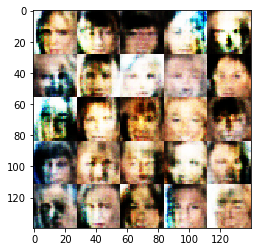

Epoch 1/5... Discriminator Loss: 1.1464... Generator Loss: 0.7190
Epoch 1/5... Discriminator Loss: 1.1837... Generator Loss: 0.6400
Epoch 1/5... Discriminator Loss: 1.2522... Generator Loss: 1.7664
Epoch 1/5... Discriminator Loss: 1.1323... Generator Loss: 0.8398


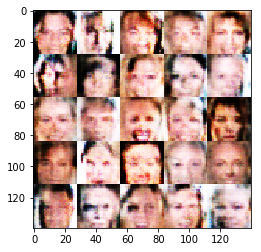

Epoch 1/5... Discriminator Loss: 1.4634... Generator Loss: 0.5258
Epoch 1/5... Discriminator Loss: 1.1624... Generator Loss: 0.8877
Epoch 1/5... Discriminator Loss: 1.1577... Generator Loss: 0.7562
Epoch 1/5... Discriminator Loss: 1.0273... Generator Loss: 0.9884


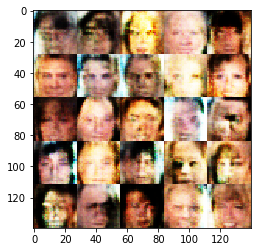

Epoch 1/5... Discriminator Loss: 1.4382... Generator Loss: 0.6426
Epoch 1/5... Discriminator Loss: 1.2021... Generator Loss: 0.7228
Epoch 1/5... Discriminator Loss: 1.2281... Generator Loss: 0.7989
Epoch 1/5... Discriminator Loss: 1.2583... Generator Loss: 0.6879


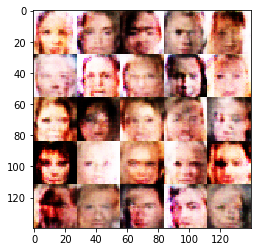

Epoch 1/5... Discriminator Loss: 1.2857... Generator Loss: 0.7859
Epoch 1/5... Discriminator Loss: 1.1281... Generator Loss: 0.9151
Epoch 1/5... Discriminator Loss: 1.1867... Generator Loss: 0.7865
Epoch 1/5... Discriminator Loss: 0.9589... Generator Loss: 1.2325


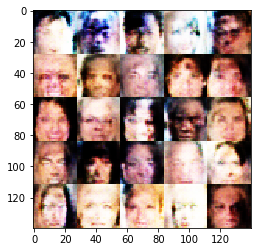

Epoch 1/5... Discriminator Loss: 1.1862... Generator Loss: 1.1139
Epoch 1/5... Discriminator Loss: 1.2149... Generator Loss: 0.6843
Epoch 1/5... Discriminator Loss: 1.0584... Generator Loss: 0.9311
Epoch 1/5... Discriminator Loss: 1.1281... Generator Loss: 0.9233


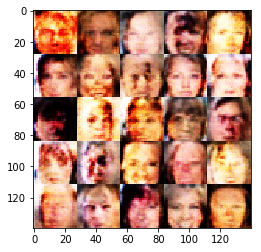

Epoch 1/5... Discriminator Loss: 1.0403... Generator Loss: 1.7061
Epoch 1/5... Discriminator Loss: 1.1640... Generator Loss: 0.8622
Epoch 1/5... Discriminator Loss: 1.0034... Generator Loss: 0.9719
Epoch 1/5... Discriminator Loss: 1.1842... Generator Loss: 0.6895


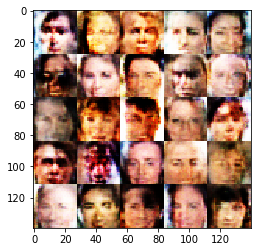

Epoch 1/5... Discriminator Loss: 0.9048... Generator Loss: 1.2270
Epoch 1/5... Discriminator Loss: 1.1622... Generator Loss: 0.8971
Epoch 1/5... Discriminator Loss: 1.2471... Generator Loss: 0.7690
Epoch 1/5... Discriminator Loss: 1.1137... Generator Loss: 0.9277


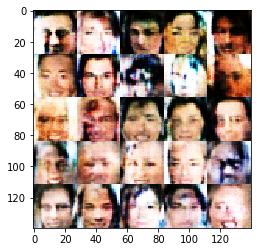

Epoch 1/5... Discriminator Loss: 1.0289... Generator Loss: 1.5455
Epoch 1/5... Discriminator Loss: 1.0186... Generator Loss: 1.2024
Epoch 1/5... Discriminator Loss: 1.2542... Generator Loss: 0.7294
Epoch 1/5... Discriminator Loss: 1.0938... Generator Loss: 0.8491


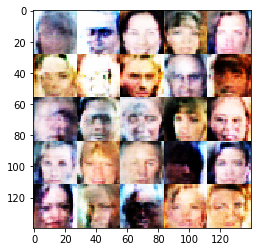

Epoch 1/5... Discriminator Loss: 1.0369... Generator Loss: 0.9841
Epoch 1/5... Discriminator Loss: 0.9103... Generator Loss: 1.7695
Epoch 1/5... Discriminator Loss: 0.9826... Generator Loss: 1.1187
Epoch 1/5... Discriminator Loss: 0.9336... Generator Loss: 1.0827


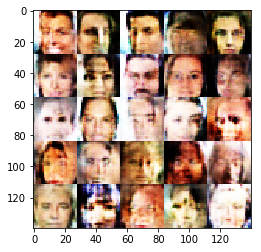

Epoch 1/5... Discriminator Loss: 1.1777... Generator Loss: 0.9195
Epoch 1/5... Discriminator Loss: 1.0854... Generator Loss: 1.0757
Epoch 1/5... Discriminator Loss: 1.1829... Generator Loss: 1.0933
Epoch 1/5... Discriminator Loss: 1.2360... Generator Loss: 0.8121


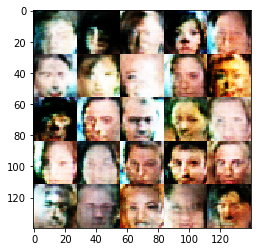

Epoch 1/5... Discriminator Loss: 1.0672... Generator Loss: 1.0053
Epoch 1/5... Discriminator Loss: 1.1632... Generator Loss: 0.6574
Epoch 1/5... Discriminator Loss: 1.0193... Generator Loss: 1.0782
Epoch 1/5... Discriminator Loss: 0.9869... Generator Loss: 0.9829


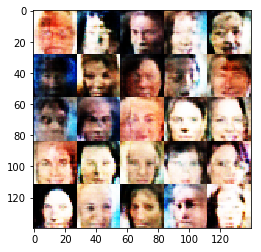

Epoch 1/5... Discriminator Loss: 1.1116... Generator Loss: 0.8238
Epoch 1/5... Discriminator Loss: 1.1776... Generator Loss: 0.7695
Epoch 1/5... Discriminator Loss: 1.3239... Generator Loss: 0.5531
Epoch 4/5... Discriminator Loss: 0.5384... Generator Loss: 2.0611


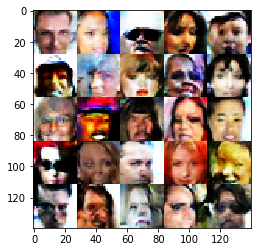

Epoch 4/5... Discriminator Loss: 0.8427... Generator Loss: 1.1236
Epoch 4/5... Discriminator Loss: 0.5901... Generator Loss: 1.9207
Epoch 4/5... Discriminator Loss: 0.8149... Generator Loss: 1.2440
Epoch 4/5... Discriminator Loss: 0.7085... Generator Loss: 1.3723


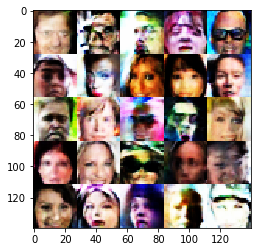

Epoch 4/5... Discriminator Loss: 0.4965... Generator Loss: 2.5704
Epoch 4/5... Discriminator Loss: 0.8613... Generator Loss: 1.1889
Epoch 4/5... Discriminator Loss: 0.6489... Generator Loss: 1.6709
Epoch 4/5... Discriminator Loss: 0.7508... Generator Loss: 1.4122


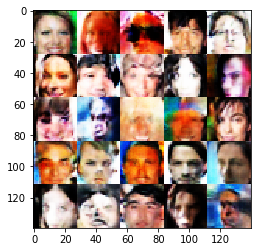

Epoch 4/5... Discriminator Loss: 0.4018... Generator Loss: 3.3175
Epoch 4/5... Discriminator Loss: 0.5360... Generator Loss: 2.1857
Epoch 4/5... Discriminator Loss: 0.6706... Generator Loss: 1.5915
Epoch 4/5... Discriminator Loss: 0.6585... Generator Loss: 2.5487


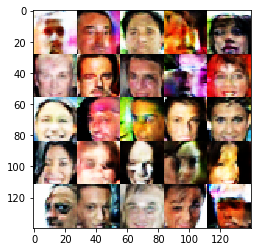

Epoch 4/5... Discriminator Loss: 0.8510... Generator Loss: 1.0724
Epoch 4/5... Discriminator Loss: 0.4615... Generator Loss: 2.6839
Epoch 4/5... Discriminator Loss: 0.5998... Generator Loss: 2.4617
Epoch 4/5... Discriminator Loss: 0.4400... Generator Loss: 2.7482


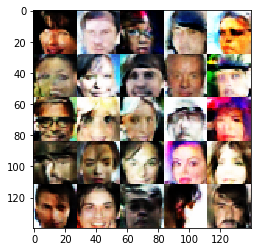

Epoch 4/5... Discriminator Loss: 0.5473... Generator Loss: 2.6613
Epoch 4/5... Discriminator Loss: 0.5040... Generator Loss: 2.4707
Epoch 4/5... Discriminator Loss: 0.9218... Generator Loss: 1.1926
Epoch 4/5... Discriminator Loss: 1.3474... Generator Loss: 0.6179


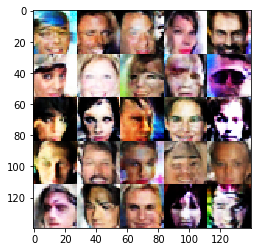

Epoch 4/5... Discriminator Loss: 1.3907... Generator Loss: 0.5343
Epoch 4/5... Discriminator Loss: 0.6763... Generator Loss: 1.4919
Epoch 4/5... Discriminator Loss: 0.8362... Generator Loss: 1.2917
Epoch 4/5... Discriminator Loss: 2.3499... Generator Loss: 0.2881


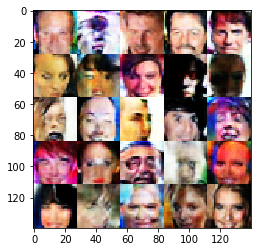

Epoch 4/5... Discriminator Loss: 0.6466... Generator Loss: 1.7945
Epoch 4/5... Discriminator Loss: 0.4582... Generator Loss: 2.5373
Epoch 4/5... Discriminator Loss: 0.6233... Generator Loss: 1.6647
Epoch 4/5... Discriminator Loss: 0.6984... Generator Loss: 1.4875


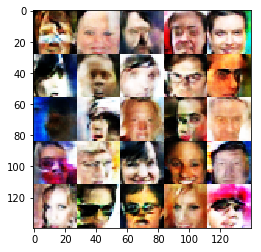

Epoch 4/5... Discriminator Loss: 0.6339... Generator Loss: 1.6377
Epoch 4/5... Discriminator Loss: 0.7141... Generator Loss: 1.5211
Epoch 4/5... Discriminator Loss: 0.5603... Generator Loss: 2.0351
Epoch 4/5... Discriminator Loss: 0.6819... Generator Loss: 1.4746


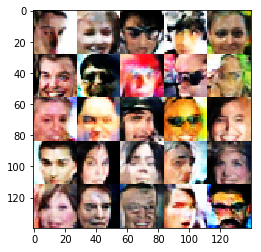

Epoch 4/5... Discriminator Loss: 0.6584... Generator Loss: 1.6021
Epoch 4/5... Discriminator Loss: 0.5787... Generator Loss: 1.8548
Epoch 4/5... Discriminator Loss: 0.7336... Generator Loss: 1.3188
Epoch 4/5... Discriminator Loss: 0.7287... Generator Loss: 1.3634


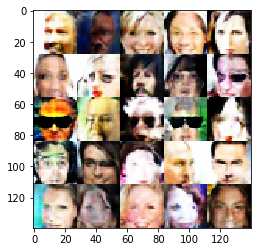

Epoch 4/5... Discriminator Loss: 0.5279... Generator Loss: 2.2205
Epoch 4/5... Discriminator Loss: 0.4810... Generator Loss: 2.6855
Epoch 4/5... Discriminator Loss: 0.6133... Generator Loss: 2.0033
Epoch 4/5... Discriminator Loss: 0.5008... Generator Loss: 2.4601


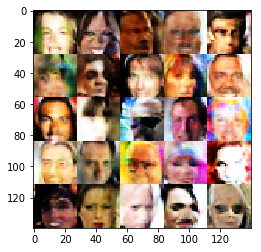

Epoch 4/5... Discriminator Loss: 0.6660... Generator Loss: 1.5901
Epoch 4/5... Discriminator Loss: 0.5677... Generator Loss: 2.0365
Epoch 4/5... Discriminator Loss: 0.6245... Generator Loss: 1.5012
Epoch 4/5... Discriminator Loss: 0.6893... Generator Loss: 1.4758


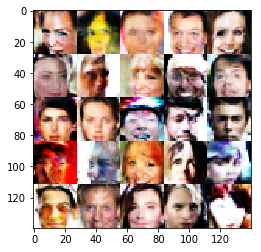

Epoch 4/5... Discriminator Loss: 0.5557... Generator Loss: 2.1294
Epoch 4/5... Discriminator Loss: 0.7908... Generator Loss: 1.3947
Epoch 4/5... Discriminator Loss: 0.7116... Generator Loss: 1.4616
Epoch 4/5... Discriminator Loss: 0.5505... Generator Loss: 1.9618


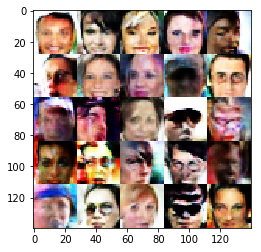

Epoch 4/5... Discriminator Loss: 0.5774... Generator Loss: 1.8324
Epoch 4/5... Discriminator Loss: 0.7741... Generator Loss: 1.2900
Epoch 4/5... Discriminator Loss: 0.5673... Generator Loss: 1.9939
Epoch 4/5... Discriminator Loss: 0.6915... Generator Loss: 1.4088


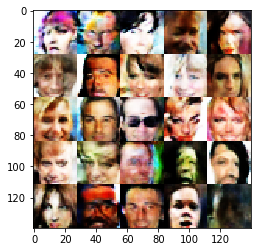

Epoch 4/5... Discriminator Loss: 1.8230... Generator Loss: 4.6420
Epoch 4/5... Discriminator Loss: 0.8554... Generator Loss: 1.1583
Epoch 4/5... Discriminator Loss: 0.7527... Generator Loss: 1.6145
Epoch 4/5... Discriminator Loss: 0.7695... Generator Loss: 1.3721


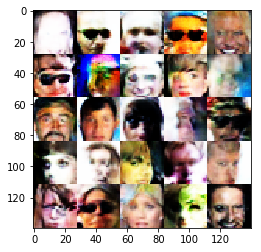

Epoch 4/5... Discriminator Loss: 1.0489... Generator Loss: 0.8462
Epoch 4/5... Discriminator Loss: 0.6945... Generator Loss: 1.4801
Epoch 4/5... Discriminator Loss: 0.7047... Generator Loss: 1.3794
Epoch 4/5... Discriminator Loss: 0.6111... Generator Loss: 1.7582


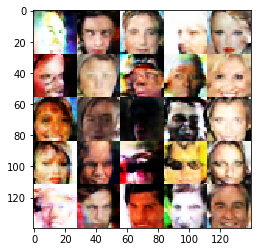

Epoch 4/5... Discriminator Loss: 0.5295... Generator Loss: 2.3190
Epoch 4/5... Discriminator Loss: 0.9619... Generator Loss: 0.9615
Epoch 4/5... Discriminator Loss: 0.6126... Generator Loss: 1.7604
Epoch 4/5... Discriminator Loss: 0.8696... Generator Loss: 1.2384


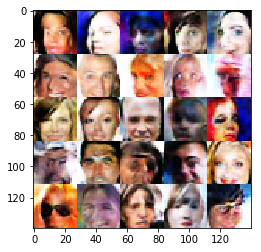

Epoch 4/5... Discriminator Loss: 0.5621... Generator Loss: 2.0647
Epoch 4/5... Discriminator Loss: 0.5274... Generator Loss: 2.2154
Epoch 4/5... Discriminator Loss: 0.5710... Generator Loss: 1.9600
Epoch 4/5... Discriminator Loss: 0.5302... Generator Loss: 3.3592


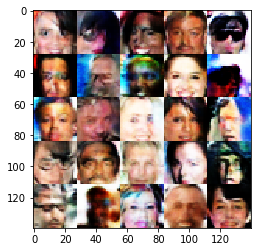

Epoch 4/5... Discriminator Loss: 0.5511... Generator Loss: 2.0405
Epoch 4/5... Discriminator Loss: 0.4987... Generator Loss: 4.2650
Epoch 4/5... Discriminator Loss: 0.5774... Generator Loss: 1.8337
Epoch 4/5... Discriminator Loss: 0.5079... Generator Loss: 2.4788


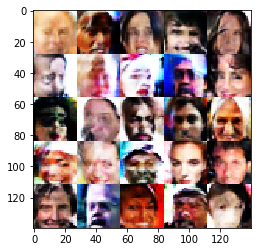

Epoch 4/5... Discriminator Loss: 0.5961... Generator Loss: 1.8173
Epoch 4/5... Discriminator Loss: 0.5116... Generator Loss: 2.0808
Epoch 4/5... Discriminator Loss: 0.7253... Generator Loss: 1.4550
Epoch 4/5... Discriminator Loss: 0.4782... Generator Loss: 2.4411


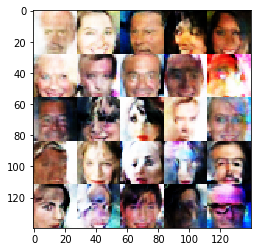

Epoch 4/5... Discriminator Loss: 0.6704... Generator Loss: 1.5528
Epoch 4/5... Discriminator Loss: 0.5015... Generator Loss: 2.5011
Epoch 4/5... Discriminator Loss: 2.9465... Generator Loss: 0.1730
Epoch 4/5... Discriminator Loss: 0.5318... Generator Loss: 2.1648


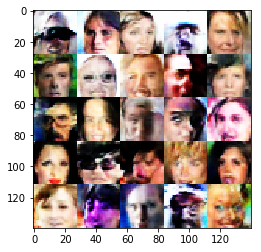

Epoch 4/5... Discriminator Loss: 0.6331... Generator Loss: 1.7383
Epoch 4/5... Discriminator Loss: 0.7195... Generator Loss: 1.3775
Epoch 4/5... Discriminator Loss: 1.2146... Generator Loss: 0.8791
Epoch 4/5... Discriminator Loss: 0.8022... Generator Loss: 1.2337


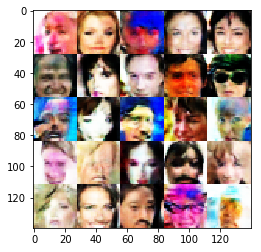

Epoch 4/5... Discriminator Loss: 0.4788... Generator Loss: 2.2980
Epoch 4/5... Discriminator Loss: 0.5759... Generator Loss: 1.8060
Epoch 4/5... Discriminator Loss: 0.4766... Generator Loss: 2.3761
Epoch 4/5... Discriminator Loss: 0.5346... Generator Loss: 1.9322


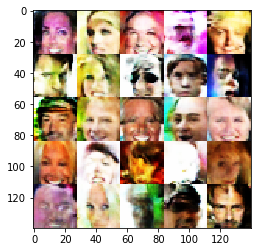

Epoch 4/5... Discriminator Loss: 1.1379... Generator Loss: 2.6182
Epoch 4/5... Discriminator Loss: 0.6131... Generator Loss: 1.8027
Epoch 4/5... Discriminator Loss: 0.7476... Generator Loss: 1.3450
Epoch 4/5... Discriminator Loss: 0.4620... Generator Loss: 2.5104


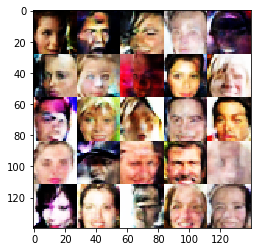

Epoch 4/5... Discriminator Loss: 0.6005... Generator Loss: 1.6783
Epoch 4/5... Discriminator Loss: 0.7983... Generator Loss: 1.3216
Epoch 4/5... Discriminator Loss: 0.5337... Generator Loss: 2.0336
Epoch 4/5... Discriminator Loss: 0.5405... Generator Loss: 2.0101


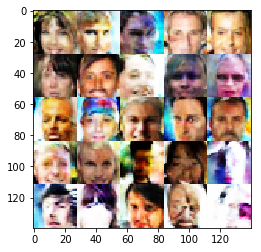

Epoch 4/5... Discriminator Loss: 0.9331... Generator Loss: 3.6153
Epoch 4/5... Discriminator Loss: 0.5900... Generator Loss: 1.9287
Epoch 4/5... Discriminator Loss: 0.9751... Generator Loss: 1.0584
Epoch 4/5... Discriminator Loss: 1.3978... Generator Loss: 0.5809


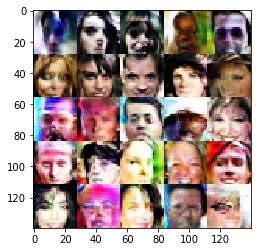

Epoch 4/5... Discriminator Loss: 0.8906... Generator Loss: 1.0355
Epoch 4/5... Discriminator Loss: 0.6426... Generator Loss: 2.2597
Epoch 4/5... Discriminator Loss: 0.6677... Generator Loss: 1.5196
Epoch 4/5... Discriminator Loss: 0.6280... Generator Loss: 1.6214


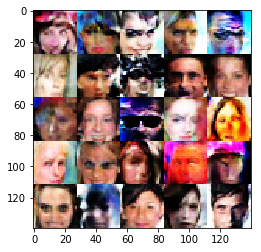

Epoch 4/5... Discriminator Loss: 0.5628... Generator Loss: 2.0254
Epoch 4/5... Discriminator Loss: 0.5336... Generator Loss: 2.3776
Epoch 4/5... Discriminator Loss: 0.9074... Generator Loss: 1.1828
Epoch 4/5... Discriminator Loss: 0.4300... Generator Loss: 2.8792


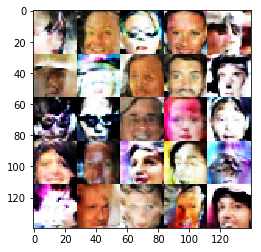

Epoch 4/5... Discriminator Loss: 0.4696... Generator Loss: 2.5746
Epoch 4/5... Discriminator Loss: 0.5913... Generator Loss: 1.7533
Epoch 4/5... Discriminator Loss: 0.5955... Generator Loss: 1.8973
Epoch 4/5... Discriminator Loss: 0.6734... Generator Loss: 1.4707


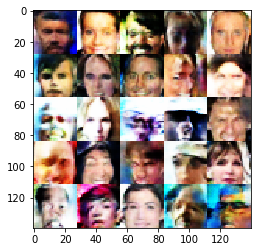

Epoch 4/5... Discriminator Loss: 0.7711... Generator Loss: 1.3484
Epoch 4/5... Discriminator Loss: 0.6528... Generator Loss: 1.7054
Epoch 4/5... Discriminator Loss: 0.4432... Generator Loss: 2.7365
Epoch 4/5... Discriminator Loss: 0.6757... Generator Loss: 1.5671


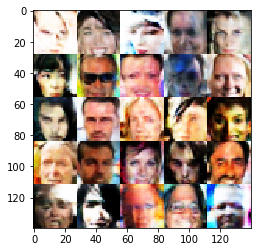

Epoch 4/5... Discriminator Loss: 0.9378... Generator Loss: 0.9834
Epoch 4/5... Discriminator Loss: 0.5507... Generator Loss: 2.0445
Epoch 4/5... Discriminator Loss: 0.9343... Generator Loss: 1.1860
Epoch 4/5... Discriminator Loss: 1.0464... Generator Loss: 1.0286


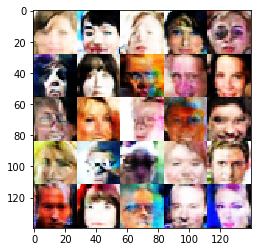

Epoch 4/5... Discriminator Loss: 0.7866... Generator Loss: 1.4964
Epoch 4/5... Discriminator Loss: 0.7222... Generator Loss: 1.4671
Epoch 4/5... Discriminator Loss: 0.5852... Generator Loss: 1.8166
Epoch 4/5... Discriminator Loss: 0.5315... Generator Loss: 2.2019


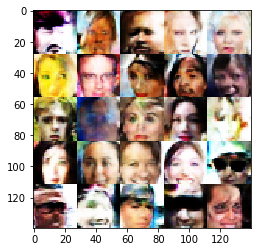

Epoch 4/5... Discriminator Loss: 0.5827... Generator Loss: 1.7417
Epoch 4/5... Discriminator Loss: 1.0205... Generator Loss: 0.8617
Epoch 4/5... Discriminator Loss: 0.6204... Generator Loss: 1.7844
Epoch 4/5... Discriminator Loss: 0.5436... Generator Loss: 2.1253


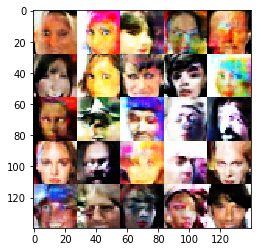

Epoch 4/5... Discriminator Loss: 0.5038... Generator Loss: 2.3080
Epoch 4/5... Discriminator Loss: 0.5989... Generator Loss: 1.8950
Epoch 4/5... Discriminator Loss: 1.3610... Generator Loss: 0.6937
Epoch 4/5... Discriminator Loss: 0.6748... Generator Loss: 1.6131


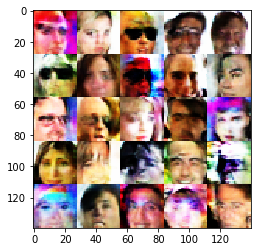

Epoch 4/5... Discriminator Loss: 0.7478... Generator Loss: 1.4214
Epoch 4/5... Discriminator Loss: 0.5154... Generator Loss: 2.1559
Epoch 4/5... Discriminator Loss: 0.5915... Generator Loss: 2.5945
Epoch 4/5... Discriminator Loss: 0.6011... Generator Loss: 1.6891


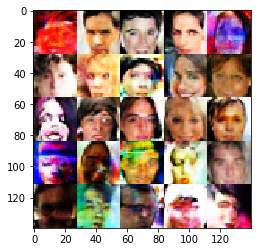

Epoch 4/5... Discriminator Loss: 1.2013... Generator Loss: 2.7386
Epoch 4/5... Discriminator Loss: 0.6501... Generator Loss: 3.2591
Epoch 4/5... Discriminator Loss: 0.7337... Generator Loss: 1.2808
Epoch 4/5... Discriminator Loss: 1.1075... Generator Loss: 3.7798


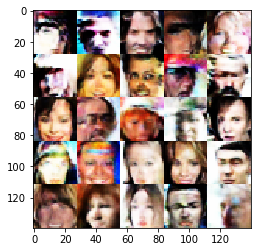

Epoch 4/5... Discriminator Loss: 0.5025... Generator Loss: 2.6083
Epoch 4/5... Discriminator Loss: 0.6749... Generator Loss: 1.4662
Epoch 4/5... Discriminator Loss: 0.6798... Generator Loss: 1.6496
Epoch 4/5... Discriminator Loss: 0.5883... Generator Loss: 1.7739


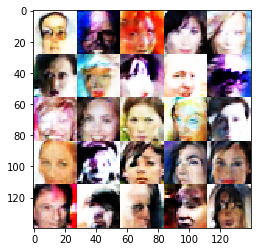

Epoch 4/5... Discriminator Loss: 0.8974... Generator Loss: 1.1723
Epoch 4/5... Discriminator Loss: 0.8422... Generator Loss: 1.2510
Epoch 4/5... Discriminator Loss: 0.5327... Generator Loss: 2.0882
Epoch 4/5... Discriminator Loss: 0.6052... Generator Loss: 1.6965


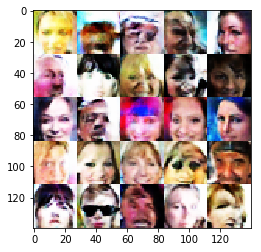

Epoch 4/5... Discriminator Loss: 0.4031... Generator Loss: 3.4592
Epoch 4/5... Discriminator Loss: 0.4450... Generator Loss: 2.9100
Epoch 4/5... Discriminator Loss: 0.6527... Generator Loss: 1.6526
Epoch 4/5... Discriminator Loss: 0.5639... Generator Loss: 1.9459


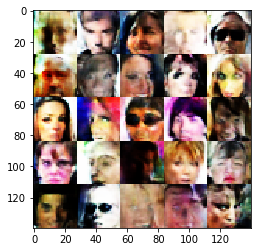

Epoch 4/5... Discriminator Loss: 0.5748... Generator Loss: 2.9306
Epoch 4/5... Discriminator Loss: 0.4960... Generator Loss: 2.7023
Epoch 4/5... Discriminator Loss: 0.4320... Generator Loss: 3.2354
Epoch 4/5... Discriminator Loss: 1.2378... Generator Loss: 0.9048


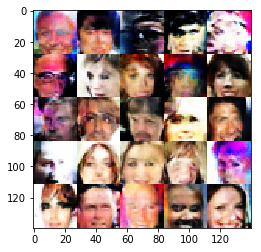

Epoch 4/5... Discriminator Loss: 1.3516... Generator Loss: 0.7791
Epoch 4/5... Discriminator Loss: 1.1729... Generator Loss: 0.7718
Epoch 4/5... Discriminator Loss: 1.3762... Generator Loss: 0.7194
Epoch 4/5... Discriminator Loss: 0.4766... Generator Loss: 2.4779


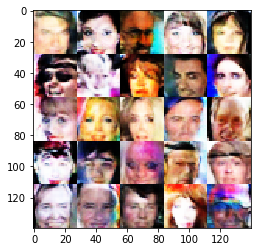

Epoch 4/5... Discriminator Loss: 0.5941... Generator Loss: 1.8640
Epoch 4/5... Discriminator Loss: 0.7633... Generator Loss: 1.4707
Epoch 4/5... Discriminator Loss: 0.6968... Generator Loss: 1.7656
Epoch 4/5... Discriminator Loss: 0.5390... Generator Loss: 2.0527


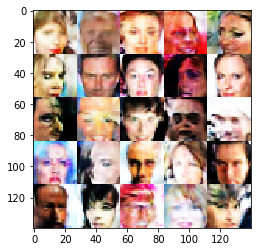

Epoch 4/5... Discriminator Loss: 1.3295... Generator Loss: 3.5726
Epoch 4/5... Discriminator Loss: 0.4999... Generator Loss: 2.2378
Epoch 4/5... Discriminator Loss: 0.5561... Generator Loss: 2.2336
Epoch 4/5... Discriminator Loss: 0.5799... Generator Loss: 2.4340


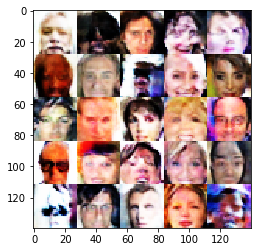

Epoch 4/5... Discriminator Loss: 0.7268... Generator Loss: 1.5110
Epoch 4/5... Discriminator Loss: 0.5022... Generator Loss: 2.2977
Epoch 4/5... Discriminator Loss: 2.9892... Generator Loss: 0.2418
Epoch 4/5... Discriminator Loss: 0.4876... Generator Loss: 2.8254


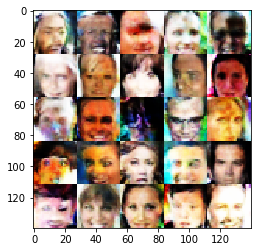

Epoch 4/5... Discriminator Loss: 0.5846... Generator Loss: 2.0709
Epoch 4/5... Discriminator Loss: 0.6208... Generator Loss: 1.7024
Epoch 4/5... Discriminator Loss: 0.4194... Generator Loss: 3.3301
Epoch 4/5... Discriminator Loss: 0.6407... Generator Loss: 1.6579


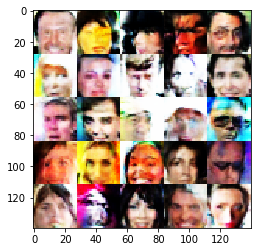

Epoch 4/5... Discriminator Loss: 0.6221... Generator Loss: 1.5275
Epoch 4/5... Discriminator Loss: 0.7325... Generator Loss: 1.3975
Epoch 4/5... Discriminator Loss: 0.5603... Generator Loss: 1.8962
Epoch 4/5... Discriminator Loss: 0.6333... Generator Loss: 1.7778


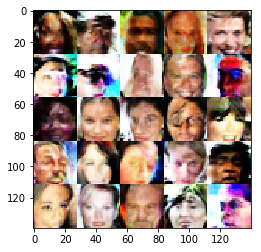

Epoch 5/5... Discriminator Loss: 0.5022... Generator Loss: 2.8332
Epoch 5/5... Discriminator Loss: 2.4051... Generator Loss: 0.1937
Epoch 5/5... Discriminator Loss: 0.5838... Generator Loss: 1.9856
Epoch 5/5... Discriminator Loss: 0.7340... Generator Loss: 1.3668


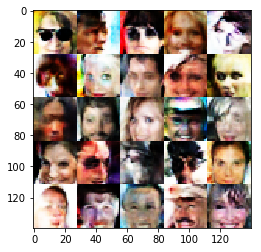

Epoch 5/5... Discriminator Loss: 0.5449... Generator Loss: 2.0188
Epoch 5/5... Discriminator Loss: 0.6449... Generator Loss: 1.6248
Epoch 5/5... Discriminator Loss: 0.5538... Generator Loss: 1.9606
Epoch 5/5... Discriminator Loss: 0.5476... Generator Loss: 1.9550


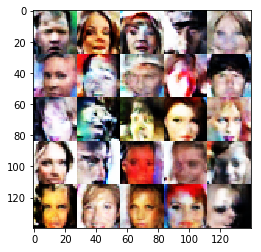

Epoch 5/5... Discriminator Loss: 0.5802... Generator Loss: 1.9075
Epoch 5/5... Discriminator Loss: 0.7684... Generator Loss: 1.2266
Epoch 5/5... Discriminator Loss: 0.5408... Generator Loss: 2.0357
Epoch 5/5... Discriminator Loss: 0.4993... Generator Loss: 2.1951


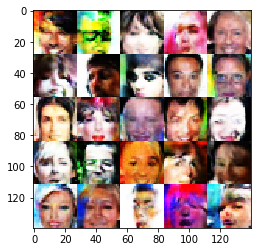

Epoch 5/5... Discriminator Loss: 0.6284... Generator Loss: 1.7945
Epoch 5/5... Discriminator Loss: 0.6831... Generator Loss: 1.5271
Epoch 5/5... Discriminator Loss: 0.5261... Generator Loss: 2.3727
Epoch 5/5... Discriminator Loss: 0.4156... Generator Loss: 2.8812


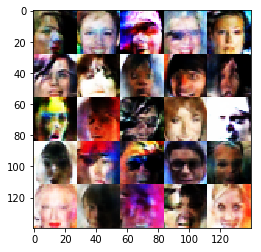

Epoch 5/5... Discriminator Loss: 0.6998... Generator Loss: 1.3870
Epoch 5/5... Discriminator Loss: 0.4159... Generator Loss: 3.2944
Epoch 5/5... Discriminator Loss: 0.5899... Generator Loss: 2.0264
Epoch 5/5... Discriminator Loss: 0.5260... Generator Loss: 1.9578


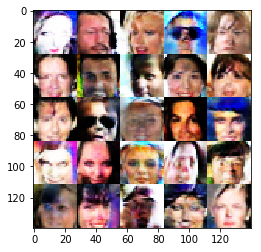

Epoch 5/5... Discriminator Loss: 1.1933... Generator Loss: 0.8085
Epoch 5/5... Discriminator Loss: 0.5828... Generator Loss: 1.9110
Epoch 5/5... Discriminator Loss: 0.9381... Generator Loss: 1.1164
Epoch 5/5... Discriminator Loss: 0.8927... Generator Loss: 1.0620


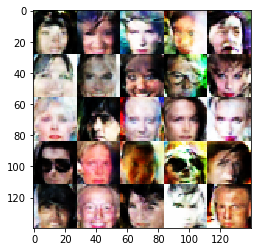

Epoch 5/5... Discriminator Loss: 0.5133... Generator Loss: 2.2594
Epoch 5/5... Discriminator Loss: 0.6691... Generator Loss: 1.6446
Epoch 5/5... Discriminator Loss: 0.5719... Generator Loss: 1.8419
Epoch 5/5... Discriminator Loss: 0.4433... Generator Loss: 2.7173


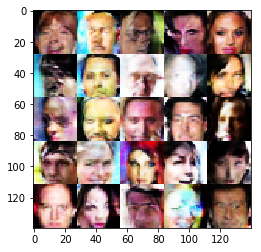

Epoch 5/5... Discriminator Loss: 0.5032... Generator Loss: 2.2946
Epoch 5/5... Discriminator Loss: 0.7631... Generator Loss: 1.2983
Epoch 5/5... Discriminator Loss: 0.5502... Generator Loss: 2.2372
Epoch 5/5... Discriminator Loss: 0.4307... Generator Loss: 2.8788


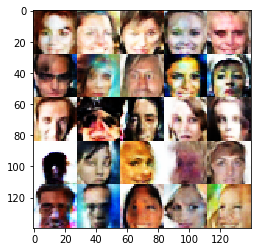

Epoch 5/5... Discriminator Loss: 0.5398... Generator Loss: 2.0042
Epoch 5/5... Discriminator Loss: 2.9722... Generator Loss: 0.1538
Epoch 5/5... Discriminator Loss: 0.4489... Generator Loss: 4.2689
Epoch 5/5... Discriminator Loss: 0.5728... Generator Loss: 1.8792


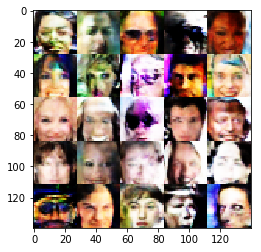

Epoch 5/5... Discriminator Loss: 0.6457... Generator Loss: 1.6160
Epoch 5/5... Discriminator Loss: 0.5562... Generator Loss: 2.0332
Epoch 5/5... Discriminator Loss: 0.6391... Generator Loss: 1.6951
Epoch 5/5... Discriminator Loss: 1.8311... Generator Loss: 0.4537


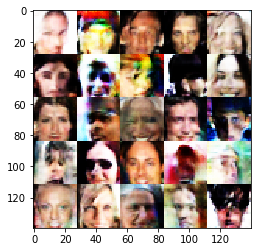

Epoch 5/5... Discriminator Loss: 0.7453... Generator Loss: 1.5574
Epoch 5/5... Discriminator Loss: 0.4950... Generator Loss: 2.5444
Epoch 5/5... Discriminator Loss: 0.5111... Generator Loss: 2.3965
Epoch 5/5... Discriminator Loss: 0.4292... Generator Loss: 2.8853


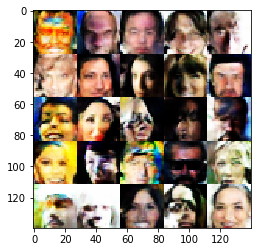

Epoch 5/5... Discriminator Loss: 0.5477... Generator Loss: 2.3948
Epoch 5/5... Discriminator Loss: 1.1836... Generator Loss: 0.8870
Epoch 5/5... Discriminator Loss: 0.4290... Generator Loss: 2.9106
Epoch 5/5... Discriminator Loss: 0.5220... Generator Loss: 2.5070


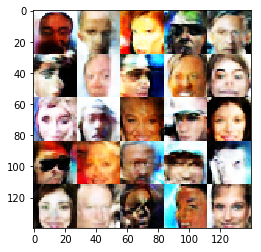

Epoch 5/5... Discriminator Loss: 0.5375... Generator Loss: 2.1439
Epoch 5/5... Discriminator Loss: 0.6443... Generator Loss: 2.1058
Epoch 5/5... Discriminator Loss: 0.4763... Generator Loss: 2.3938
Epoch 5/5... Discriminator Loss: 0.6669... Generator Loss: 1.5221


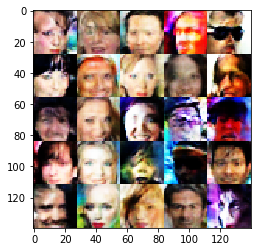

Epoch 5/5... Discriminator Loss: 0.5510... Generator Loss: 1.9974
Epoch 5/5... Discriminator Loss: 0.5653... Generator Loss: 1.9442
Epoch 5/5... Discriminator Loss: 0.9653... Generator Loss: 1.0527
Epoch 5/5... Discriminator Loss: 0.6444... Generator Loss: 1.6137


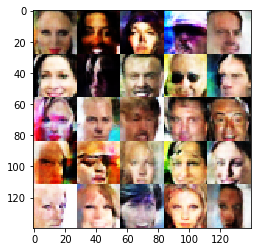

Epoch 5/5... Discriminator Loss: 1.5066... Generator Loss: 0.5520
Epoch 5/5... Discriminator Loss: 0.5296... Generator Loss: 2.0779
Epoch 5/5... Discriminator Loss: 0.5992... Generator Loss: 1.8099
Epoch 5/5... Discriminator Loss: 0.4658... Generator Loss: 2.4718


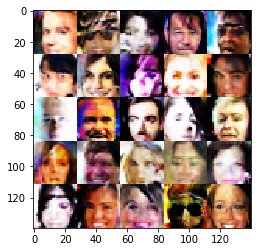

Epoch 5/5... Discriminator Loss: 0.5424... Generator Loss: 1.9543
Epoch 5/5... Discriminator Loss: 0.7019... Generator Loss: 1.4769
Epoch 5/5... Discriminator Loss: 0.5930... Generator Loss: 1.7439
Epoch 5/5... Discriminator Loss: 0.7992... Generator Loss: 1.1498


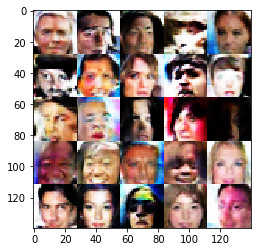

Epoch 5/5... Discriminator Loss: 0.7206... Generator Loss: 1.3473
Epoch 5/5... Discriminator Loss: 0.5219... Generator Loss: 2.1519
Epoch 5/5... Discriminator Loss: 0.7954... Generator Loss: 1.2390
Epoch 5/5... Discriminator Loss: 1.1302... Generator Loss: 0.8569


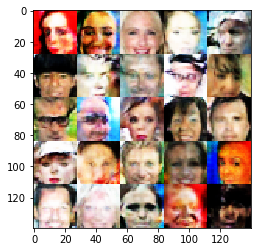

Epoch 5/5... Discriminator Loss: 1.3519... Generator Loss: 0.8046
Epoch 5/5... Discriminator Loss: 0.4379... Generator Loss: 2.8302
Epoch 5/5... Discriminator Loss: 0.5159... Generator Loss: 2.2181
Epoch 5/5... Discriminator Loss: 0.6249... Generator Loss: 1.6663


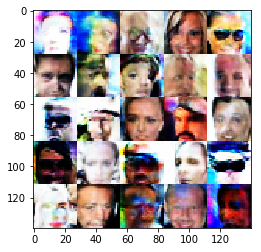

Epoch 5/5... Discriminator Loss: 0.5347... Generator Loss: 2.2217
Epoch 5/5... Discriminator Loss: 0.4393... Generator Loss: 2.8097
Epoch 5/5... Discriminator Loss: 0.8017... Generator Loss: 1.2960
Epoch 5/5... Discriminator Loss: 0.9429... Generator Loss: 0.9382


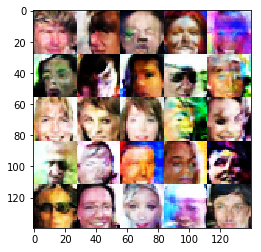

Epoch 5/5... Discriminator Loss: 0.6104... Generator Loss: 2.0937
Epoch 5/5... Discriminator Loss: 0.9165... Generator Loss: 1.0366
Epoch 5/5... Discriminator Loss: 0.5205... Generator Loss: 2.3627
Epoch 5/5... Discriminator Loss: 1.6954... Generator Loss: 0.5132


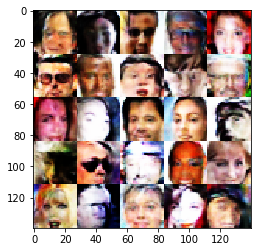

Epoch 5/5... Discriminator Loss: 0.4560... Generator Loss: 2.7761
Epoch 5/5... Discriminator Loss: 0.5646... Generator Loss: 1.8942
Epoch 5/5... Discriminator Loss: 0.4565... Generator Loss: 2.6381
Epoch 5/5... Discriminator Loss: 0.7653... Generator Loss: 1.3998


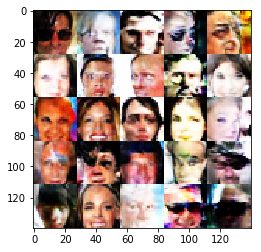

Epoch 5/5... Discriminator Loss: 0.4659... Generator Loss: 2.8904
Epoch 5/5... Discriminator Loss: 0.5857... Generator Loss: 1.8628
Epoch 5/5... Discriminator Loss: 0.6535... Generator Loss: 1.5644
Epoch 5/5... Discriminator Loss: 0.4606... Generator Loss: 2.3891


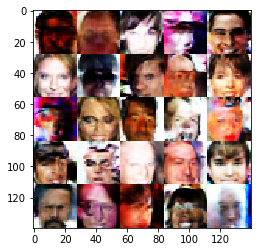

Epoch 5/5... Discriminator Loss: 0.5537... Generator Loss: 2.0818
Epoch 5/5... Discriminator Loss: 0.5138... Generator Loss: 3.4747
Epoch 5/5... Discriminator Loss: 0.5728... Generator Loss: 1.8292
Epoch 5/5... Discriminator Loss: 0.6080... Generator Loss: 1.7720


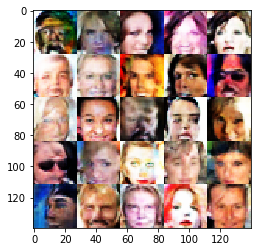

Epoch 5/5... Discriminator Loss: 1.6578... Generator Loss: 0.6199
Epoch 5/5... Discriminator Loss: 0.6453... Generator Loss: 1.5427
Epoch 5/5... Discriminator Loss: 1.0465... Generator Loss: 0.8660
Epoch 5/5... Discriminator Loss: 0.7413... Generator Loss: 1.3256


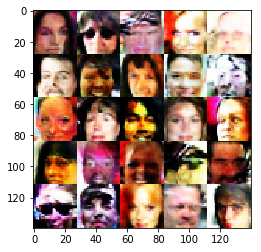

Epoch 5/5... Discriminator Loss: 0.7438... Generator Loss: 1.2791
Epoch 5/5... Discriminator Loss: 0.6082... Generator Loss: 1.8327
Epoch 5/5... Discriminator Loss: 0.6717... Generator Loss: 1.6058
Epoch 5/5... Discriminator Loss: 1.6879... Generator Loss: 0.5483


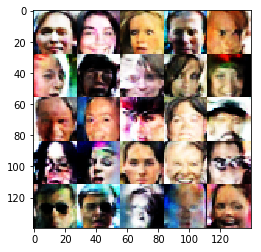

Epoch 5/5... Discriminator Loss: 0.4381... Generator Loss: 2.9609
Epoch 5/5... Discriminator Loss: 0.6923... Generator Loss: 1.5109
Epoch 5/5... Discriminator Loss: 0.4825... Generator Loss: 2.4458
Epoch 5/5... Discriminator Loss: 0.6198... Generator Loss: 1.8153


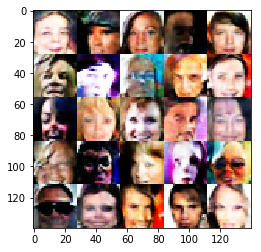

Epoch 5/5... Discriminator Loss: 0.4318... Generator Loss: 2.9183
Epoch 5/5... Discriminator Loss: 0.4996... Generator Loss: 2.2115
Epoch 5/5... Discriminator Loss: 0.5950... Generator Loss: 1.7628
Epoch 5/5... Discriminator Loss: 0.8991... Generator Loss: 1.0384


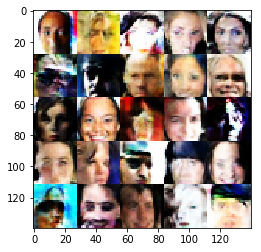

Epoch 5/5... Discriminator Loss: 0.9848... Generator Loss: 0.9470
Epoch 5/5... Discriminator Loss: 0.4523... Generator Loss: 2.4700
Epoch 5/5... Discriminator Loss: 0.8724... Generator Loss: 4.8326
Epoch 5/5... Discriminator Loss: 0.7503... Generator Loss: 1.3707


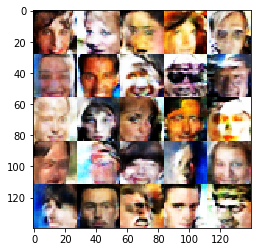

Epoch 5/5... Discriminator Loss: 0.5295... Generator Loss: 2.2582
Epoch 5/5... Discriminator Loss: 1.9369... Generator Loss: 0.4027
Epoch 5/5... Discriminator Loss: 0.6494... Generator Loss: 1.5736
Epoch 5/5... Discriminator Loss: 0.7396... Generator Loss: 1.3605


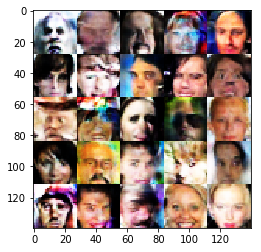

Epoch 5/5... Discriminator Loss: 0.4698... Generator Loss: 2.4863
Epoch 5/5... Discriminator Loss: 0.5622... Generator Loss: 2.2713
Epoch 5/5... Discriminator Loss: 0.4408... Generator Loss: 3.0308
Epoch 5/5... Discriminator Loss: 0.9989... Generator Loss: 1.0113


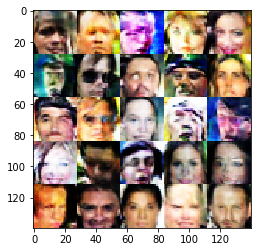

Epoch 5/5... Discriminator Loss: 0.5524... Generator Loss: 2.1828
Epoch 5/5... Discriminator Loss: 0.8146... Generator Loss: 1.5215
Epoch 5/5... Discriminator Loss: 0.6838... Generator Loss: 1.6764
Epoch 5/5... Discriminator Loss: 0.5627... Generator Loss: 1.9329


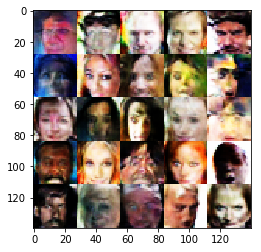

Epoch 5/5... Discriminator Loss: 0.5025... Generator Loss: 2.2745
Epoch 5/5... Discriminator Loss: 1.1667... Generator Loss: 0.8343
Epoch 5/5... Discriminator Loss: 0.8575... Generator Loss: 1.2680
Epoch 5/5... Discriminator Loss: 0.6228... Generator Loss: 1.6863


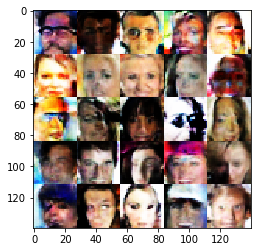

Epoch 5/5... Discriminator Loss: 1.1932... Generator Loss: 0.9979
Epoch 5/5... Discriminator Loss: 1.0293... Generator Loss: 0.9602
Epoch 5/5... Discriminator Loss: 1.7755... Generator Loss: 4.3644
Epoch 5/5... Discriminator Loss: 1.2625... Generator Loss: 0.6939


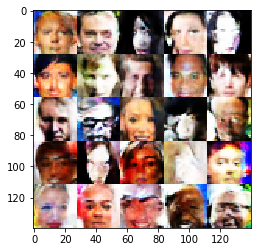

Epoch 5/5... Discriminator Loss: 0.7330... Generator Loss: 1.3295
Epoch 5/5... Discriminator Loss: 0.6627... Generator Loss: 1.5035
Epoch 5/5... Discriminator Loss: 0.4892... Generator Loss: 2.2499
Epoch 5/5... Discriminator Loss: 0.5362... Generator Loss: 1.9601


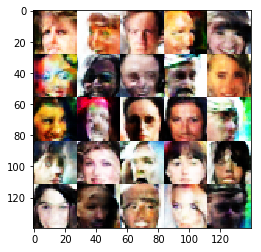

Epoch 5/5... Discriminator Loss: 0.5826... Generator Loss: 1.9766
Epoch 5/5... Discriminator Loss: 0.6455... Generator Loss: 1.5660
Epoch 5/5... Discriminator Loss: 0.5434... Generator Loss: 1.9679
Epoch 5/5... Discriminator Loss: 0.7231... Generator Loss: 1.9806


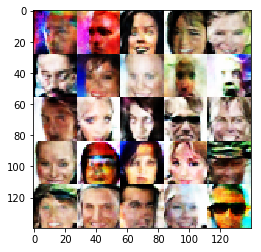

Epoch 5/5... Discriminator Loss: 0.7011... Generator Loss: 1.4464
Epoch 5/5... Discriminator Loss: 0.7092... Generator Loss: 1.3962
Epoch 5/5... Discriminator Loss: 0.8212... Generator Loss: 1.1238
Epoch 5/5... Discriminator Loss: 0.4581... Generator Loss: 2.6495


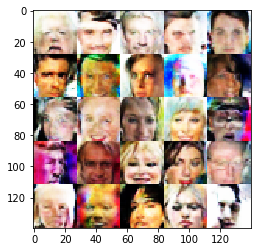

Epoch 5/5... Discriminator Loss: 0.5102... Generator Loss: 2.2638
Epoch 5/5... Discriminator Loss: 1.5230... Generator Loss: 3.5072
Epoch 5/5... Discriminator Loss: 0.4818... Generator Loss: 2.5794
Epoch 5/5... Discriminator Loss: 0.8733... Generator Loss: 1.2573


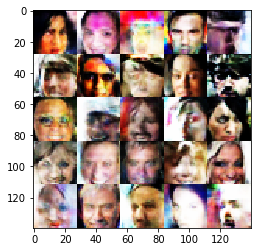

Epoch 5/5... Discriminator Loss: 0.5589... Generator Loss: 1.9710
Epoch 5/5... Discriminator Loss: 0.7180... Generator Loss: 1.5286
Epoch 5/5... Discriminator Loss: 0.5783... Generator Loss: 1.7614
Epoch 5/5... Discriminator Loss: 0.7456... Generator Loss: 1.6106


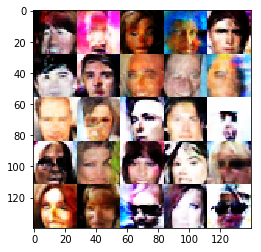

Epoch 5/5... Discriminator Loss: 0.4697... Generator Loss: 2.4486
Epoch 5/5... Discriminator Loss: 0.4507... Generator Loss: 2.9059
Epoch 5/5... Discriminator Loss: 0.4168... Generator Loss: 3.0449
Epoch 5/5... Discriminator Loss: 1.4784... Generator Loss: 0.6549


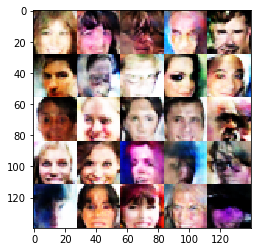

Epoch 5/5... Discriminator Loss: 0.4608... Generator Loss: 2.7853
Epoch 5/5... Discriminator Loss: 0.6113... Generator Loss: 1.5201
Epoch 5/5... Discriminator Loss: 3.9807... Generator Loss: 0.0703
Epoch 5/5... Discriminator Loss: 0.9048... Generator Loss: 1.1076


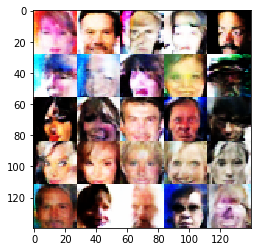

Epoch 5/5... Discriminator Loss: 1.2253... Generator Loss: 0.9561
Epoch 5/5... Discriminator Loss: 0.9202... Generator Loss: 1.1154
Epoch 5/5... Discriminator Loss: 0.8248... Generator Loss: 1.1823
Epoch 5/5... Discriminator Loss: 0.5712... Generator Loss: 1.9017


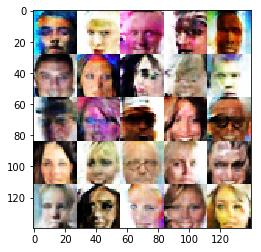

Epoch 5/5... Discriminator Loss: 1.0784... Generator Loss: 0.8443
Epoch 5/5... Discriminator Loss: 0.4099... Generator Loss: 3.8557
Epoch 5/5... Discriminator Loss: 0.7986... Generator Loss: 1.3421
Epoch 5/5... Discriminator Loss: 0.9774... Generator Loss: 0.9493


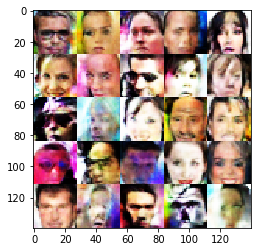

Epoch 5/5... Discriminator Loss: 0.3717... Generator Loss: 5.3322
Epoch 5/5... Discriminator Loss: 0.5159... Generator Loss: 2.0984
Epoch 5/5... Discriminator Loss: 0.7652... Generator Loss: 1.4297
Epoch 5/5... Discriminator Loss: 0.5668... Generator Loss: 1.8810


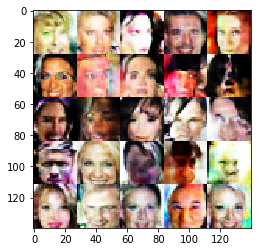

Epoch 5/5... Discriminator Loss: 0.7085... Generator Loss: 1.5307
Epoch 5/5... Discriminator Loss: 0.6591... Generator Loss: 1.6173
Epoch 5/5... Discriminator Loss: 0.5777... Generator Loss: 1.9431
Epoch 5/5... Discriminator Loss: 0.4985... Generator Loss: 2.6033


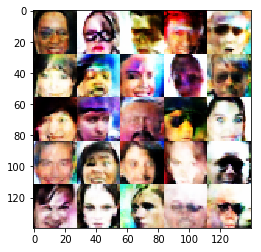

Epoch 5/5... Discriminator Loss: 0.4916... Generator Loss: 2.3349
Epoch 5/5... Discriminator Loss: 0.5795... Generator Loss: 1.6992
Epoch 5/5... Discriminator Loss: 0.4660... Generator Loss: 2.6368
Epoch 5/5... Discriminator Loss: 0.8831... Generator Loss: 1.3507


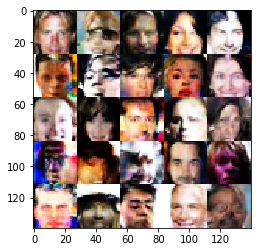

Epoch 5/5... Discriminator Loss: 0.8518... Generator Loss: 1.1032
Epoch 5/5... Discriminator Loss: 0.5073... Generator Loss: 2.0740
Epoch 5/5... Discriminator Loss: 0.5904... Generator Loss: 1.7936
Epoch 5/5... Discriminator Loss: 0.6010... Generator Loss: 1.9970


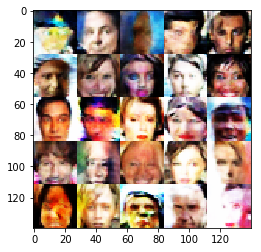

Epoch 5/5... Discriminator Loss: 0.5587... Generator Loss: 2.0501
Epoch 5/5... Discriminator Loss: 0.4988... Generator Loss: 2.4032
Epoch 5/5... Discriminator Loss: 0.7103... Generator Loss: 1.4846
Epoch 5/5... Discriminator Loss: 0.6891... Generator Loss: 1.5107


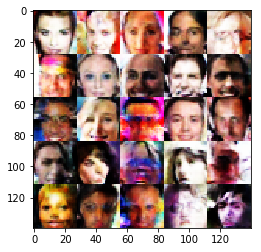

Epoch 5/5... Discriminator Loss: 0.7491... Generator Loss: 1.4019
Epoch 5/5... Discriminator Loss: 0.5296... Generator Loss: 2.0673
Epoch 5/5... Discriminator Loss: 0.7985... Generator Loss: 1.3423
Epoch 5/5... Discriminator Loss: 0.4010... Generator Loss: 3.9271


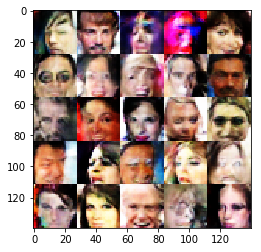

Epoch 5/5... Discriminator Loss: 0.6791... Generator Loss: 1.3923
Epoch 5/5... Discriminator Loss: 0.6346... Generator Loss: 1.8205
Epoch 5/5... Discriminator Loss: 0.5594... Generator Loss: 1.9093
Epoch 5/5... Discriminator Loss: 0.9118... Generator Loss: 1.0887


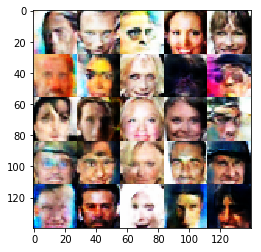

Epoch 5/5... Discriminator Loss: 0.7291... Generator Loss: 1.3010
Epoch 5/5... Discriminator Loss: 0.6927... Generator Loss: 1.6589
Epoch 5/5... Discriminator Loss: 0.9830... Generator Loss: 0.9315
Epoch 5/5... Discriminator Loss: 0.5026... Generator Loss: 2.2901


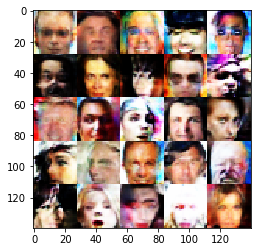

Epoch 5/5... Discriminator Loss: 0.9885... Generator Loss: 1.0107
Epoch 5/5... Discriminator Loss: 0.6765... Generator Loss: 1.4244
Epoch 5/5... Discriminator Loss: 0.4925... Generator Loss: 2.4679
Epoch 5/5... Discriminator Loss: 0.7085... Generator Loss: 1.4264


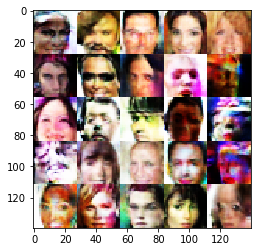

Epoch 5/5... Discriminator Loss: 0.6719... Generator Loss: 1.4318
Epoch 5/5... Discriminator Loss: 0.4547... Generator Loss: 2.4168
Epoch 5/5... Discriminator Loss: 0.8639... Generator Loss: 1.2403
Epoch 5/5... Discriminator Loss: 0.6364... Generator Loss: 1.6019


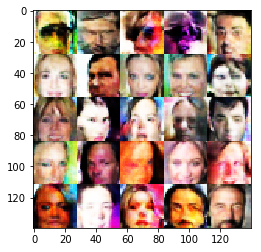

Epoch 5/5... Discriminator Loss: 0.4997... Generator Loss: 2.2637
Epoch 5/5... Discriminator Loss: 0.8210... Generator Loss: 1.3657
Epoch 5/5... Discriminator Loss: 0.5248... Generator Loss: 2.0478
Epoch 5/5... Discriminator Loss: 0.4217... Generator Loss: 3.0701


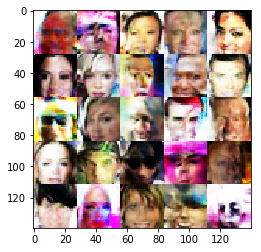

Epoch 5/5... Discriminator Loss: 0.5366... Generator Loss: 2.3618
Epoch 5/5... Discriminator Loss: 0.4066... Generator Loss: 3.0893
Epoch 5/5... Discriminator Loss: 0.7457... Generator Loss: 1.5610
Epoch 5/5... Discriminator Loss: 0.6759... Generator Loss: 1.5708


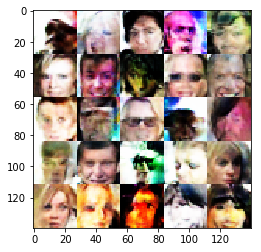

Epoch 5/5... Discriminator Loss: 0.9890... Generator Loss: 0.8753
Epoch 5/5... Discriminator Loss: 0.4972... Generator Loss: 2.8692
Epoch 5/5... Discriminator Loss: 0.5761... Generator Loss: 1.9047
Epoch 5/5... Discriminator Loss: 0.7454... Generator Loss: 1.3712


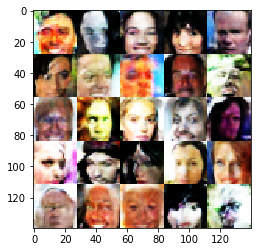

Epoch 5/5... Discriminator Loss: 0.6058... Generator Loss: 1.6906
Epoch 5/5... Discriminator Loss: 0.6547... Generator Loss: 1.6583
Epoch 5/5... Discriminator Loss: 0.5308... Generator Loss: 2.7365
Epoch 5/5... Discriminator Loss: 1.4619... Generator Loss: 0.5455


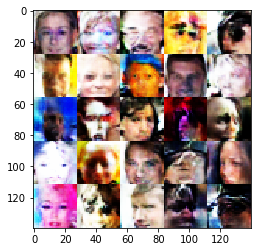

Epoch 5/5... Discriminator Loss: 0.6700... Generator Loss: 1.5569
Epoch 5/5... Discriminator Loss: 0.4975... Generator Loss: 2.2980
Epoch 5/5... Discriminator Loss: 0.4779... Generator Loss: 2.4386
Epoch 5/5... Discriminator Loss: 0.9317... Generator Loss: 1.0870


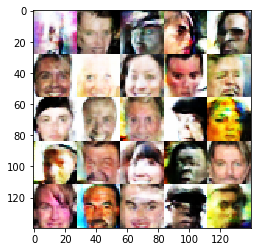

Epoch 5/5... Discriminator Loss: 0.5434... Generator Loss: 2.2479
Epoch 5/5... Discriminator Loss: 0.4693... Generator Loss: 2.5028
Epoch 5/5... Discriminator Loss: 0.4265... Generator Loss: 2.7354
Epoch 5/5... Discriminator Loss: 0.4267... Generator Loss: 3.5459


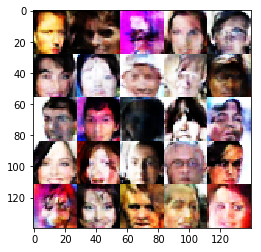

Epoch 5/5... Discriminator Loss: 0.4909... Generator Loss: 2.5801
Epoch 5/5... Discriminator Loss: 0.4810... Generator Loss: 2.3640
Epoch 5/5... Discriminator Loss: 0.6682... Generator Loss: 1.5038
Epoch 5/5... Discriminator Loss: 0.6272... Generator Loss: 1.7691


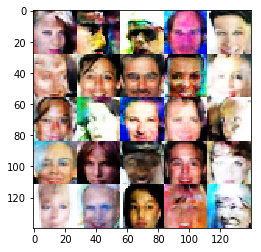

Epoch 5/5... Discriminator Loss: 0.6799... Generator Loss: 1.5026
Epoch 5/5... Discriminator Loss: 0.5333... Generator Loss: 1.9851
Epoch 5/5... Discriminator Loss: 0.6484... Generator Loss: 1.5488
Epoch 5/5... Discriminator Loss: 0.4420... Generator Loss: 3.0131


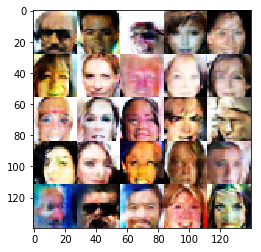

Epoch 5/5... Discriminator Loss: 0.9015... Generator Loss: 1.1683
Epoch 5/5... Discriminator Loss: 0.4937... Generator Loss: 2.3738
Epoch 5/5... Discriminator Loss: 0.6761... Generator Loss: 1.4981
Epoch 5/5... Discriminator Loss: 0.6899... Generator Loss: 1.4198


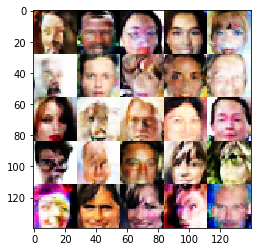

Epoch 5/5... Discriminator Loss: 1.1919... Generator Loss: 0.9987
Epoch 5/5... Discriminator Loss: 0.7276... Generator Loss: 1.4859
Epoch 5/5... Discriminator Loss: 0.6083... Generator Loss: 1.9743
Epoch 5/5... Discriminator Loss: 0.7751... Generator Loss: 1.2414


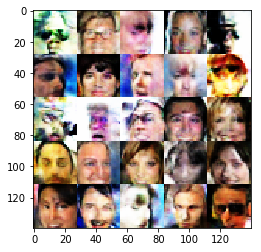

Epoch 5/5... Discriminator Loss: 0.4333... Generator Loss: 2.7651
Epoch 5/5... Discriminator Loss: 0.8319... Generator Loss: 1.2293
Epoch 5/5... Discriminator Loss: 0.7060... Generator Loss: 1.5110
Epoch 5/5... Discriminator Loss: 0.5790... Generator Loss: 1.7082


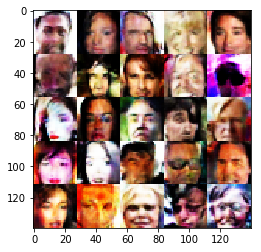

Epoch 5/5... Discriminator Loss: 1.2174... Generator Loss: 0.7436
Epoch 5/5... Discriminator Loss: 0.5842... Generator Loss: 2.0668


In [ ]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.